# Final Project DSP

# Noise removal from the audio signal using wiener filter

In [1]:
# Importing the libraries

import matplotlib.pyplot as plt
import numpy as np
import librosa, librosa.display
import math
import wave
import IPython
from glob import glob
%matplotlib inline

In [2]:
signal,sr= librosa.load('Downloads/audio_ACDC - Back In Black Intro.wav') #Loading the audio file and the loaded file is default resampled to 22050 Hz

In [3]:
sr,len(signal) # sampling rate and length of original speech signal

(22050, 573300)

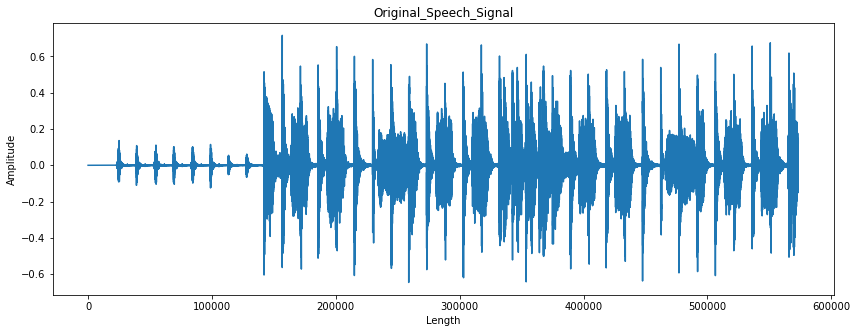

In [4]:
# Plotting the graph of my original speech signal
plt.figure(figsize=(14, 5))
plt.title("Original_Speech_Signal")
plt.xlabel('Length')
plt.ylabel("Amplitude")
plt.plot(signal)
plt.show()

# Original Audio file of the speech signal 
IPython.display.Audio(data=signal, rate=sr)

In [5]:
import IPython.display as ipd
display(ipd.Audio(signal, rate=sr));

In [6]:
# Calculating the RMS value of the speech signal
RMS=math.sqrt(np.mean(signal**2))

# Setting the RMS value of noise to be generated.
# Considering SNR=10 in RMS_N=sqrt(RMS**2)/10]
RMS_N=math.sqrt((RMS**2)/10) 
RMS_N

0.022704463868394774

In [7]:
# Generating the AWGN with required Standard deviation = RMS of the noise 
noise=np.random.normal(0, RMS_N, len(signal))*1.5# 0 mean,standard deviation= RMS_N, Number of elements in noise array 

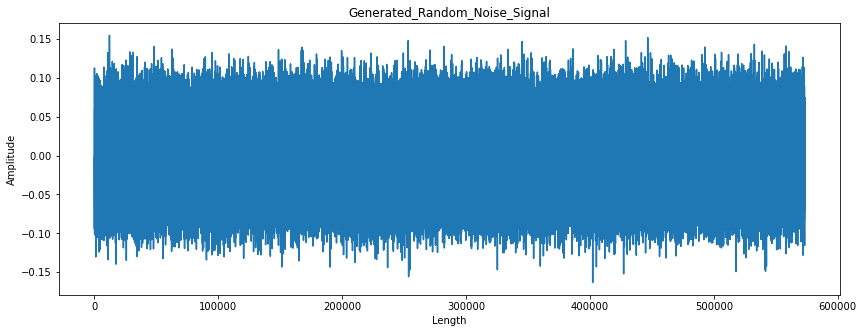

In [8]:
# Plotting the graph of genearted random noise signal
plt.figure(figsize=(14, 5))
plt.title("Generated_Random_Noise_Signal")
plt.xlabel('Length')
plt.ylabel("Amplitude")
plt.plot(noise)

# Audio file of the generated noise signal 
IPython.display.Audio(data=noise, rate=sr)

In [9]:
# Addition of generated noise and the original speech signal
signal_noise = signal+noise

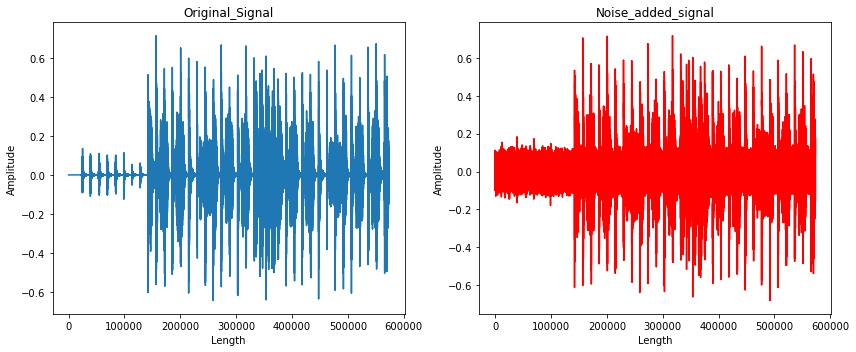

In [35]:
# Plotting the  original speech signal & currupted version of that signal by noise
fig,axes=plt.subplots(1,2,figsize=(12,5))
axes[0].plot(signal)
axes[0].set_title('Original_Signal')
axes[0].set_xlabel("Length")
axes[0].set_ylabel("Amplitude")
axes[1].plot(signal_noise,'r')
axes[1].set_title('Noise_added_signal')
axes[1].set_xlabel("Length")
axes[1].set_ylabel("Amplitude")
plt.tight_layout()

# Currupted Audio file of the speech signal
IPython.display.Audio(data=signal_noise, rate=sr)

In [11]:
# Making x & y matrix and tranposing them into a column
x=np.matrix(signal).T # Original Speech Signal
y=np.matrix(signal_noise).T # Distoted speech signal

In [12]:
# Assuming 10 coeficient for the weiner filter
A=np.matrix(np.zeros((573290,10)))
for m in range(573290):
    A[m,:]=y[m+np.arange(10)].T # our matrix has 74078 rows and 10 columns
print(A.shape)

(573290, 10)


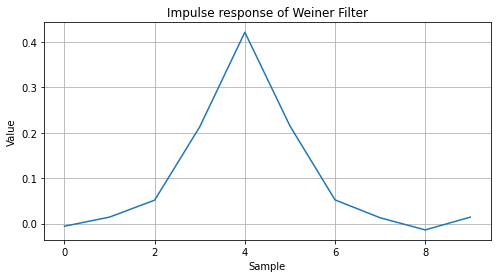

In [36]:
#Compute Wiener Filter:
#Trick: allow (flipped) filter delay of 5 samples to get better working denoising. 
#This corresponds to the center of our Wiener filter.
#The desired signal hence is x[5:74083].

h=np.linalg.inv(A.T*A)*A.T*x[5:573295]
plt.figure(figsize=(8,4))
plt.plot(np.flipud(h)) # Reverse the order of elements of h along axis 0 (up/down)
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title("Impulse response of Weiner Filter")
plt.grid()

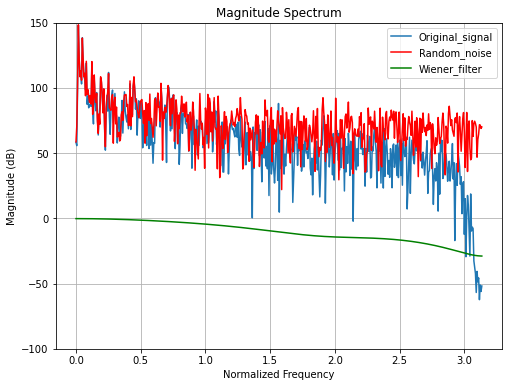

In [14]:
from scipy import signal as sp
w,Hsignal=sp.freqz(x) # Computing the frequency response of a digital filter
w,Hsignal_noise=sp.freqz(y)
w,Hw=sp.freqz(np.flipud(h))
plt.figure(figsize=(8,6))
plt.plot(w,50*np.log10(abs(Hsignal))); 
plt.plot(w,50*np.log10(abs(Hsignal_noise)),'r');
#plot the filter into the vicinity of the signal:
plt.plot(w,20*np.log10(abs(Hw)),'g')
plt.xlabel('Normalized Frequency')
plt.ylabel('Magnitude (dB)')
plt.legend(('Original_signal', 'Random_noise', 'Wiener_filter'))
plt.title('Magnitude Spectrum')
plt.ylim(-100,150)
plt.grid()

In [15]:
xw = sp.lfilter(np.array(np.flipud(h).T)[0],[1],np.array(y.T)[0])

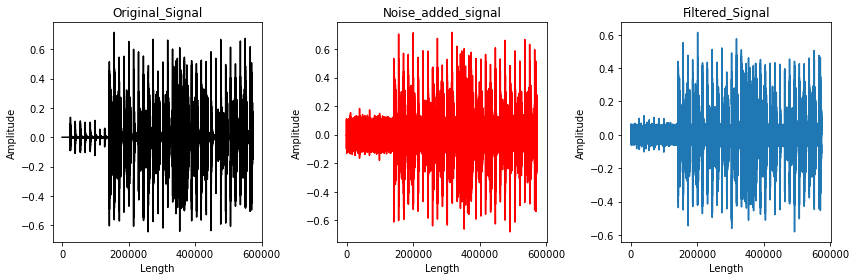

In [37]:
fig,axes=plt.subplots(1,3,figsize=(12,4))

axes[0].plot(signal,'k')
axes[0].set_title('Original_Signal')
axes[0].set_xlabel("Length")
axes[0].set_ylabel("Amplitude")
axes[1].plot(signal_noise,'r')
axes[1].set_title('Noise_added_signal')
axes[1].set_xlabel("Length")
axes[1].set_ylabel("Amplitude")
axes[2].plot(xw)
axes[2].set_title('Filtered_Signal')
axes[2].set_xlabel("Length")
axes[2].set_ylabel("Amplitude")

plt.tight_layout()

In [17]:
IPython.display.Audio(xw, rate=sr)
# display(ipd.Audio(xw, rate = fs ))

In [18]:
print( np.shape(x))
#Compute the quadratic error for the first 200000 samples:
q=sum(np.power(y[:200000]-x[:200000],2))/200000
print(q)

(573300, 1)
[[0.00116219]]


In [19]:
z= np.sum(np.power(xw[4:573304]-x[:573296].T,2))/573304
print(z)

0.0004895223608875748


In [20]:
# percentage decrease in error
p= (z/0.00115671)*100
p

42.32023245995753

# Noise removal using convolutional autoencoder

In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys
import os
import pickle

In [39]:
# Device configuration
device = torch.device('cpu')
print("device=", device) 

device= cpu


In [40]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    #Argument x: a 1-d signal as numpy array
    #input x[batch,sample]
    #output: 3-d Tensor X for conv1d input.
    #for conv1d Input: (N,Cin,Lin), Cin: numer of input channels (e.g. for stereo), Lin: length of signal, N: number of Batches (signals) 
    X = np.expand_dims(x, axis=0)  #add channels dimension (here only 1 channel)
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  #add batch dimension (here only 1 batch)
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  #make batch dimension first
    return X

In [41]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=1024, filter length of 2N, but only N/2 outputs:
        self.conv1=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=2048, stride=1024, padding=1023, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=2048, stride=1024, padding=1023, bias=True)

    def encoder(self, x): # function for the encoder
        #Analysis:
        x = self.conv1(x)
        y = torch.tanh(x)# Here we included the tanh activation function, which is used as a range limiter (between -1 and 1)
        return y
      
    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek
      
    def forward(self, x): # For both together it becomes the overall autoencoder
        y=self.encoder(x)
        #y=torch.round(y/0.125)*0.125
        xrek=self.decoder(y)
        return xrek

In [42]:
#alternative: speech:
batch=1
# audio=signal
audio, samplerate = librosa.load('Downloads/audio_ACDC - Back In Black Intro.wav', mono=False, sr=None, offset=6)
audio[0,:]/=np.abs(audio[0,:]).max()
audio[1,:]/=np.abs(audio[1,:]).max()
X_train=signal2pytorch(audio[0,:]).to(device) #Convert to pytorch format, batch is first dimension    
X_test=signal2pytorch(audio[1,:]).to(device) #Convert to pytorch format, batch is first dimension    

In [43]:
print("Generate Model:")
model = Convautoenc().to(device)
print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
print("Def. loss function:")
loss_fn = nn.MSELoss()  #MSE
    
Ypred=model(X_train)
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X_train[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X_train.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
print("Y.type()=", Y.type())

Generate Model:
Total number of parameters: 131105
Def. loss function:
outputlen= 881666
Input X.shape= torch.Size([1, 1, 882000])
Target Y.shape= torch.Size([1, 1, 881666])
Target Y= tensor([[[-0.0021,  0.0010,  0.0031,  ..., -0.0969, -0.0991, -0.0316]]])
Y.type()= torch.FloatTensor


In [27]:
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
Ypred=model(X_train)
print("Ypred=", Ypred)
randdir=False #randdir=True for optimization of random direction, False for pytorch optimization 
for epoch in range(2000):
        Ypred=model(X_train)
        #print("Ypred.shape=", Ypred.shape)
        #loss wants batch in the beginning! (Batch, Classes,...)
        #Ypredp=Ypred.permute(1,2,0)
        #Yp=Y.permute(1,0)
        #print("Ypredp.shape=", Ypredp.shape, "Yp.shape=", Yp.shape )
        loss=loss_fn(Ypred, Y)
        if epoch%10==0:
            print(epoch, loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Ypred= tensor([[[-0.0142, -0.0150, -0.0135,  ..., -0.0129, -0.0147, -0.0111]]],
       grad_fn=<ConvolutionBackward0>)
0 0.013150371611118317
10 0.012879771180450916
20 0.012461614795029163
30 0.011834791861474514
40 0.01113349013030529
50 0.01047756802290678
60 0.00987884309142828
70 0.009338806383311749
80 0.00886605866253376
90 0.0084631172940135
100 0.00812438316643238
110 0.007837168872356415
120 0.007587553933262825
130 0.007364780176430941
140 0.007162402383983135
150 0.006977017503231764
160 0.006806474644690752
170 0.006648856680840254
180 0.006502232979983091
190 0.006364775355905294
200 0.0062349457293748856
210 0.006111592054367065
220 0.005993914790451527
230 0.005881389137357473
240 0.005773678421974182
250 0.005670580547302961
260 0.0055719828233122826
270 0.005477828439325094
280 0.005388072691857815
290 0.005302649922668934
300 0.005221437197178602
310 0.00514424592256546
320 0.005070822779089212
330 0.00500087346881628
340 0.004934086464345455
350 0.004870160017162561

ww= OrderedDict([('conv1.weight', tensor([[[ 0.0203, -0.0046,  0.0197,  ..., -0.0164,  0.0200,  0.0084]],

        [[ 0.0155,  0.0060,  0.0185,  ..., -0.0128, -0.0073,  0.0159]],

        [[ 0.0194,  0.0219,  0.0149,  ..., -0.0205, -0.0177,  0.0158]],

        ...,

        [[ 0.0216, -0.0060,  0.0065,  ..., -0.0084, -0.0077,  0.0189]],

        [[-0.0213,  0.0168, -0.0112,  ...,  0.0080, -0.0071, -0.0043]],

        [[ 0.0040, -0.0031, -0.0191,  ...,  0.0057, -0.0164, -0.0137]]])), ('conv1.bias', tensor([ 0.0044,  0.0150, -0.0195, -0.0086, -0.0027,  0.0033, -0.0095, -0.0022,
        -0.0151, -0.0108, -0.0138,  0.0123, -0.0145, -0.0121, -0.0204, -0.0186,
         0.0092, -0.0059,  0.0170, -0.0075,  0.0169,  0.0057, -0.0198, -0.0007,
        -0.0079, -0.0095, -0.0173,  0.0018, -0.0016, -0.0049,  0.0113, -0.0213])), ('synconv1.weight', tensor([[[ 0.0103, -0.0164, -0.0170,  ..., -0.0208, -0.0033, -0.0209]],

        [[ 0.0059, -0.0025, -0.0189,  ..., -0.0025,  0.0044, -0.0085]],

        

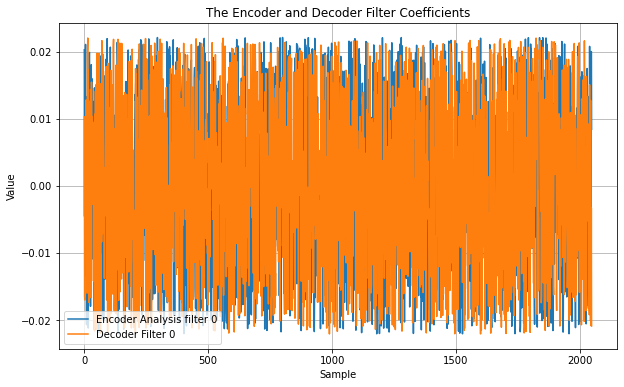

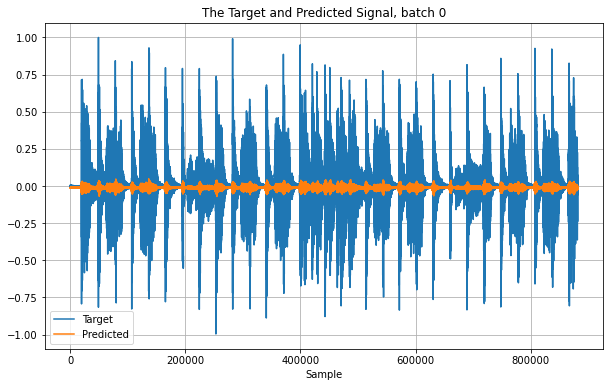

In [44]:
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,6))
plt.plot(np.transpose(np.array(ww['conv1.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

#Test on training set:
predictions=model(X_train).cpu() # Make Predictions based on the obtained weights, on training set
predictions=predictions.detach()
predictions=np.array(predictions)
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#Plot target signal and output of autoencoder:
plt.figure(figsize=(10,6))
for b in range(batch):
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()
xrek=predictions[0,:,:]  #remove unnecessary dimension for playback

<Figure size 720x432 with 0 Axes>

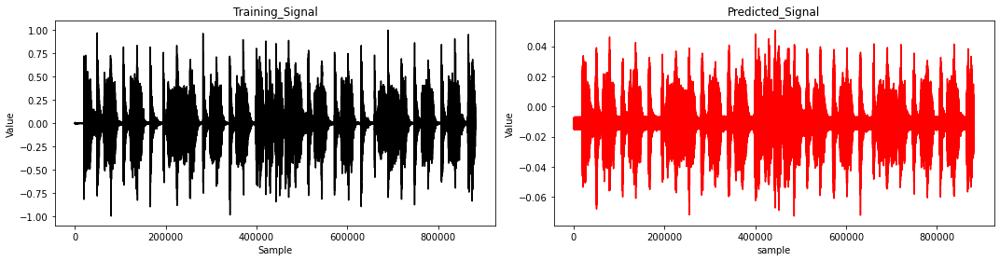

In [45]:
#Test on Verification set:
predictions=model(X_test).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
plt.figure(figsize=(10,6))

fig,axes=plt.subplots(1,2,figsize=(15,4))

axes[0].plot(np.array(X_test[b,0,:]),'k')
axes[0].set_title('Training_Signal')
axes[0].set_xlabel("Sample")
axes[0].set_ylabel("Value")

axes[1].plot(predictions[b,0,:],'r')
axes[1].set_title('Predicted_Signal')
axes[1].set_xlabel("sample")
axes[1].set_ylabel("Value")



# axes[2].plot(signal_noise,'k')
# axes[2].set_title('Currupted_Signal')
# axes[2].set_xlabel("Length")
# axes[2].set_ylabel("Amplitude")
# axes[2].set_xlim([0,40000])

# axes[3].plot(signal,'r')
# axes[3].set_title('Original_Signal')
# axes[3].set_xlabel("Length")
# axes[3].set_ylabel("Amplitude")
# axes[3].set_xlim([0,40000])


plt.tight_layout()


In [46]:
# Audio form of Predicted signal 
IPython.display.Audio(xrek, rate=samplerate)

In [47]:
#Test on shifted input:
X_train_shifted_100 = nn.ConstantPad1d(100, 0)(X_train)
predictions=model(X_train_shifted_100).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]

In [48]:
display(ipd.Audio(xrek, rate=samplerate));

In [49]:
#Test on 1024 samples shifted test set (shift identical to the stride size)
X_train_shifted_1024 = nn.ConstantPad1d(1024, 0)(X_train)
predictions=model(X_train_shifted_1024).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]

In [50]:
display(ipd.Audio(xrek, rate=samplerate));